<a href="https://colab.research.google.com/github/TattooeDeer/spectral_super_resolution/blob/master/perdida%20perceptual.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SR espectral usando arquitecturas convolucionales y funciones de pérdida no convencionales
__Paper:__ Single Image Super-Resolution via Perceptual Loss Guided by Denoising Auto-Encoder


In [ ]:
#Uncomment this lines if you are in colab

#!git clone https://github.com/TattooeDeer/spectral_super_resolution.git
#!mv  /content/spectral_super_resolution/* ./

#!pip install spectral

#from google.colab import drive
#drive.mount('/content/drive')

### Instructions to set-up the data path of the dataset

In the variable `BASE_PATH` it's expected to be the folder in which all the sub-folders of the different parts of the dataset are, this variable should hold the path to `Memoria` folder in the following image:

<img src = 'colab_instructions_1.png'>

Note that you should connect to your Google Drive account and your should have authorization to access the folder, this authorization is given by the autor of this work on request.

In [ ]:
#BASE_PATH = '/content/drive/My Drive/Memoria'
BASE_PATH = ''

In [ ]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
%autoreload 2

In [ ]:
from utiles import *
from modelos import *


In [ ]:
import torch
from torch import nn
from data_preproc import *
from datasets import *
from modelos import *
from utiles import *
from torchsummary import summary
from spectral import *
import matplotlib.pyplot as plt
import seaborn as sn
import torch.nn.functional as F
from torch.autograd import Variable
ssim = SSIM()

torch.manual_seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(11235813)



In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')


Using device: cuda

GeForce RTX 2070
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


## Conjuntos de datos

In [ ]:
# Nota: HTH es HyperioToHyperion, es para poder entrenar el autoencoder

df_spectral_train_pre_HTH = SpectralDataset_npy(BASE_PATH + 'Images/hyperion_train_npy', BASE_PATH + 'Images/hyperion_train_npy')
df_spectral_train_pre = SpectralDataset_npy(BASE_PATH + 'Images/landsat_train_npy', BASE_PATH + 'Images/hyperion_train_npy')

df_spectral_train_HTH, df_spectral_val_HTH = random_split(df_spectral_train_pre_HTH,
                                                  [int(np.floor(len(df_spectral_train_pre_HTH)*0.8)),
                                                   int(np.ceil(len(df_spectral_train_pre_HTH)*0.2))])

df_spectral_train, df_spectral_val = random_split(df_spectral_train_pre,
                                                  [int(np.floor(len(df_spectral_train_pre)*0.8)),
                                                   int(np.ceil(len(df_spectral_train_pre)*0.2))])

df_spectral_test = SpectralDataset_npy(BASE_PATH + 'Images/landsat_test_npy', BASE_PATH + 'Images/hyperion_test_npy')
df_spectral_test_HTH = SpectralDataset_npy(BASE_PATH + 'Images/hyperion_test_npy', BASE_PATH + 'Images/hyperion_test_npy')


train_loader = DataLoader(dataset = df_spectral_train, batch_size = 32, shuffle = True)
train_loader_HTH = DataLoader(dataset = df_spectral_train_HTH, batch_size = 32, shuffle = True)

val_loader = DataLoader(dataset = df_spectral_val, batch_size = 32, shuffle = True)
val_loader_HTH = DataLoader(dataset = df_spectral_val_HTH, batch_size = 32, shuffle = True)

test_loader = DataLoader(dataset = df_spectral_test, batch_size = 1, shuffle = True)
test_loader_HTH = DataLoader(dataset = df_spectral_test_HTH, batch_size = 1, shuffle = True)

In [ ]:
print(f'N° Ejemplos train: {len(df_spectral_train)}')
print(f'N° Ejemplos Test: {len(df_spectral_test)}')
print(f'N° Ejemplos Val: {len(df_spectral_val)}')
print(f'N° Ejemplos train (AutoEncoder): {len(df_spectral_train_HTH)}')
print(f'N° Ejemplos Test (AutoEncoder): {len(df_spectral_test_HTH)}')
print(f'N° Ejemplos Val (AutoEncoder): {len(df_spectral_val_HTH)}')

N° Ejemplos train: 3715
N° Ejemplos Test: 2314
N° Ejemplos Val: 929
N° Ejemplos train (AutoEncoder): 3715
N° Ejemplos Test (AutoEncoder): 2314
N° Ejemplos Val (AutoEncoder): 929


In [ ]:
prop_hyperion, prop_landsat, scenes_patches = get_hyperion_landsat_bands(hyperion_properties_path = BASE_PATH + 'Images/propertiesH_metadata.txt',
                                                                     landsat_properties_path= BASE_PATH + 'Images/propertiesL8_metadata.txt',
                                                                        hyperion_imgs_path='Images/hyperion_test_npy/')

# Symmetric AutoEncoder


## SDAE 90/45/10

* $n_c$ upper block = 90
* $n_c$ middle block = 45
* $n_c$ lower block = 10

In [ ]:
AEHG_90_45_10 = Hourglass(175, 175, 90, 45, 10)
AEHG_90_45_10.to(device);
summary(AEHG_90_45_10, input_size=(175, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 90, 64, 64]         141,840
         LeakyReLU-2           [-1, 90, 64, 64]               0
            Conv2d-3           [-1, 90, 64, 64]          72,990
         LeakyReLU-4           [-1, 90, 64, 64]               0
            Conv2d-5           [-1, 45, 64, 64]         101,295
         LeakyReLU-6           [-1, 45, 64, 64]               0
            Conv2d-7           [-1, 45, 64, 64]          50,670
         LeakyReLU-8           [-1, 45, 64, 64]               0
            Conv2d-9           [-1, 10, 64, 64]           4,060
        LeakyReLU-10           [-1, 10, 64, 64]               0
           Conv2d-11           [-1, 10, 64, 64]             910
        LeakyReLU-12           [-1, 10, 64, 64]               0
           Conv2d-13           [-1, 10, 64, 64]             460
           Conv2d-14           [-1, 45,

In [ ]:
n_epochs = 3
lr = 1e-4
loss_fn = MSELoss(reduction = 'mean')
optimizer = optim.Adam(AEHG_90_45_10.parameters(), lr = lr)


In [ ]:
%%time
AEHG_90_45_10_TrainDict = train_model(AEHG_90_45_10, n_epochs, loss_fn, optimizer, train_loader_HTH, val_loader_HTH, device)

Epoch N°: 1
	Batch N°: 0
	  * Train loss: 4287080.0
	  * Val loss: 4234818.066666666
	  * Val SSIM: 0.017929772256563108
	Batch N°: 1
	  * Train loss: 4171139.0
	  * Val loss: 4124462.066666667
	  * Val SSIM: 0.017541916326930126
	Batch N°: 2
	  * Train loss: 4349851.0
	  * Val loss: 3986314.4166666665
	  * Val SSIM: 0.02253200231740872
	Batch N°: 3
	  * Train loss: 3566222.5
	  * Val loss: 3932723.0
	  * Val SSIM: 0.03114243069042762
	Batch N°: 4
	  * Train loss: 3357859.75
	  * Val loss: 3770626.95
	  * Val SSIM: 0.04381213753173749
	Batch N°: 5
	  * Train loss: 3756740.25
	  * Val loss: 3402402.283333333
	  * Val SSIM: 0.06315257300933202
	Batch N°: 6
	  * Train loss: 3519683.5
	  * Val loss: 2975466.4125
	  * Val SSIM: 0.0881030907233556
	Batch N°: 7
	  * Train loss: 2582834.0
	  * Val loss: 2591010.058333333
	  * Val SSIM: 0.12093446428577105
	Batch N°: 8
	  * Train loss: 3029300.25
	  * Val loss: 2185322.6333333333
	  * Val SSIM: 0.15463006496429443
	Batch N°: 9
	  * Train loss: 

KeyboardInterrupt: 

Average MSE (Test): 96442.10828218007
RMSE (Test): 310.5512973442231
RMSE scaled to reflectance (Test: 0.03105512973442231
Average SSIM(Test): 0.589740479456755


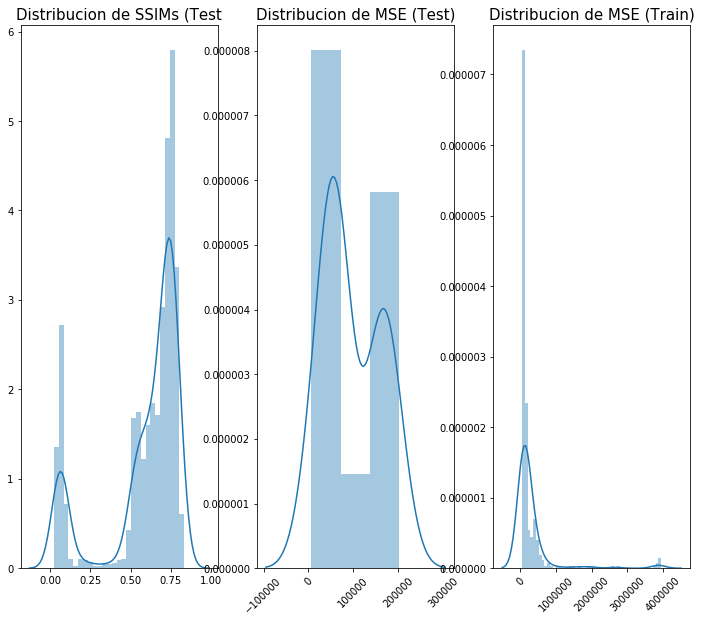

In [ ]:
AEHG_90_45_10_TestLosses = get_metrics(AEHG_90_45_10, test_loader_HTH, device = device, losses_train = AEHG_90_45_10_TrainDict['train_losses'],
                                      per_band_error=True, prop_hyperion = prop_hyperion)

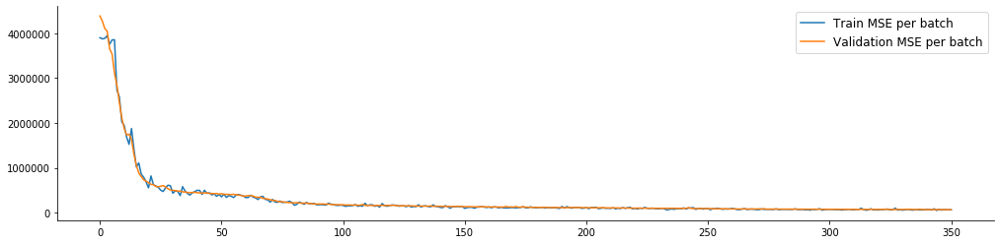

In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len(AEHG_90_45_10_TrainDict['train_losses'])), y = AEHG_90_45_10_TrainDict['train_losses'], 
            label = 'Train MSE per batch')
sn.lineplot(x = range(len(AEHG_90_45_10_TrainDict['val_losses'])), y = AEHG_90_45_10_TrainDict['val_losses'], 
            label = 'Validation MSE per batch')
#sn.lineplot(x = range(len(patch_landsat[pos_row,pos_col,:])), y = patch_landsat[pos_row, pos_col, :]/10000,
#            label = 'Original LandSat-8 OLI Spectra', ax = ax[1])
sn.despine()
plt.legend(fontsize = 12);

In [ ]:

#torch.save(AEHG_90_45_10.state_dict(), '/AEHG_90_45_10.pt')
#np.save('/test_losses_AEHG_90_45_10.npy', AEHG_90_45_10_test_losses)
#np.save('/train_losses_AEHG_90_45_10.npy', AEHG_90_45_10_TrainDict['train_losses'])

# Reload Model with states
AEHG_90_45_10 = Hourglass(175, 175, 90, 45, 10)
AEHG_90_45_10.load_state_dict(torch.load("Models/AEHG_90_45_10.pt"))
AEHG_90_45_10.to(device);


-----

## SDAE 150/100/75


In [ ]:
AEHG_150_100_75 = Hourglass(175, 175, 150, 100, 75)
#model_sdae.load_state_dict(torch.load(save_model_path))
AEHG_150_100_75.to(device);

In [ ]:
summary(AEHG_150_100_75, input_size=(175, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 150, 64, 64]         236,400
         LeakyReLU-2          [-1, 150, 64, 64]               0
            Conv2d-3          [-1, 150, 64, 64]         202,650
         LeakyReLU-4          [-1, 150, 64, 64]               0
            Conv2d-5          [-1, 100, 64, 64]         375,100
         LeakyReLU-6          [-1, 100, 64, 64]               0
            Conv2d-7          [-1, 100, 64, 64]         250,100
         LeakyReLU-8          [-1, 100, 64, 64]               0
            Conv2d-9           [-1, 75, 64, 64]          67,575
        LeakyReLU-10           [-1, 75, 64, 64]               0
           Conv2d-11           [-1, 75, 64, 64]          50,700
        LeakyReLU-12           [-1, 75, 64, 64]               0
           Conv2d-13           [-1, 75, 64, 64]           7,575
           Conv2d-14          [-1, 100,

In [ ]:
n_epochs = 4
lr = 1e-3
loss_fn = MSELoss(reduction = 'mean')
optimizer = optim.Adam(AEHG_150_100_75.parameters(), lr = lr)


In [ ]:
AEHG_150_100_75_TrainDict = train_model(AEHG_150_100_75, n_epochs, loss_fn, optimizer, train_loader_HTH, val_loader_HTH, device = device)

Epoch N°: 1
	Batch N°: 0
	  * Train loss: 4779692.0
	  * Val loss: 3454181.1625
	Batch N°: 1
	  * Train loss: 3170529.25
	  * Val loss: 3900289.808333333
	Batch N°: 2
	  * Train loss: 3726465.5
	  * Val loss: 3565689.3833333333
	Batch N°: 3
	  * Train loss: 3469319.25
	  * Val loss: 1495057.3083333333
	Batch N°: 4
	  * Train loss: 1268763.0
	  * Val loss: 187087901.86666667
	Batch N°: 5
	  * Train loss: 190578448.0
	  * Val loss: 1104930.2604166667
	Batch N°: 6
	  * Train loss: 822126.5
	  * Val loss: 2208914.7416666667
	Batch N°: 7
	  * Train loss: 1845671.5
	  * Val loss: 2605934.5125
	Batch N°: 8
	  * Train loss: 3430108.0
	  * Val loss: 2043787.9333333333
	Batch N°: 9
	  * Train loss: 1805123.625
	  * Val loss: 3501177.5375
	Batch N°: 10
	  * Train loss: 3460922.0
	  * Val loss: 1983687.2375
	Batch N°: 11
	  * Train loss: 1869429.0
	  * Val loss: 1991904.5416666667
	Batch N°: 12
	  * Train loss: 1864499.5
	  * Val loss: 1430717.3041666667
	Batch N°: 13
	  * Train loss: 1519941.125


Average MSE (Test): 93688.58089192708
RMSE (Test): 306.0859044319537
RMSE scaled to reflectance (Test: 0.030608590443195367
Average SSIM(Test): 0.6100827668501304


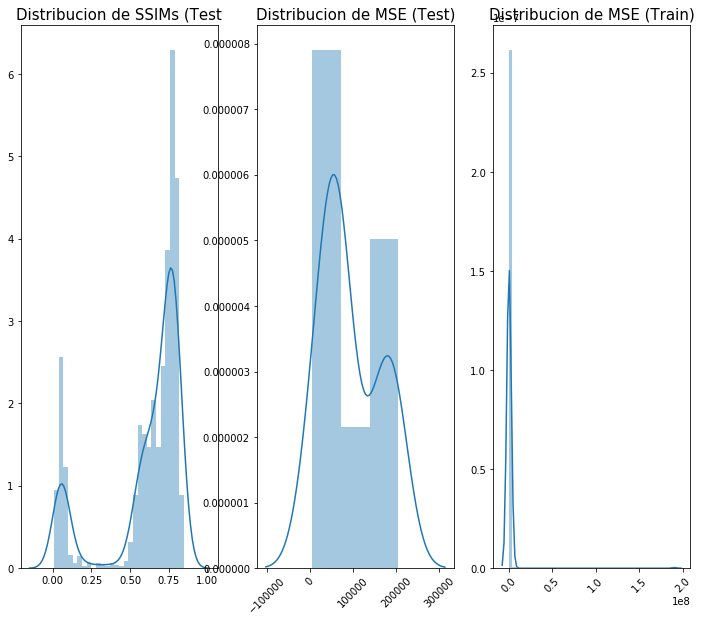

In [ ]:
AEHG_150_100_75_test_losses = get_metrics(AEHG_150_100_75, test_loader_HTH, device = device, losses_train = AEHG_150_100_75_TrainDict['train_losses'],
                                         per_band_error=True, prop_hyperion = prop_hyperion)

In [ ]:

#torch.save(AEHG_150_100_75.state_dict(), '/AEHG_150_100_75.pt')
#np.save('/test_losses_sdae_AEHG_150_100_75.npy', AEHG_150_100_75_test_losses)
#np.save('/train_losses_AEHG_150_100_75.npy', AEHG_150_100_75_TrainDict['train_losses'])

# Reload Model with states
AEHG_150_100_75 = Hourglass(175, 175, 150, 100, 75)
AEHG_150_100_75.load_state_dict(torch.load("Models/AEHG_150_100_75.pt"))
AEHG_150_100_75.to(device);

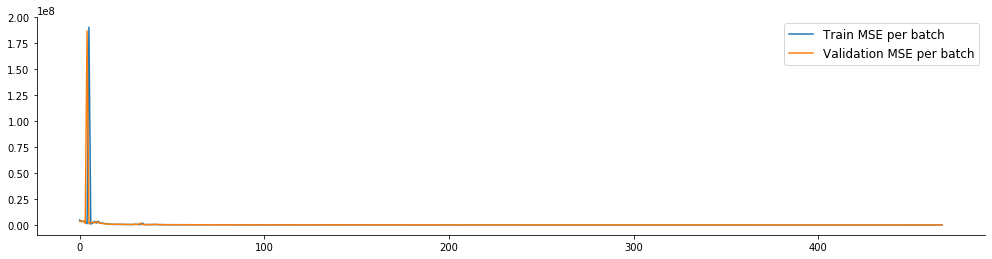

In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len(AEHG_150_100_75_TrainDict['train_losses'])), y = AEHG_150_100_75_TrainDict['train_losses'], 
            label = 'Train MSE per batch')
sn.lineplot(x = range(len(AEHG_150_100_75_TrainDict['val_losses'])), y = AEHG_150_100_75_TrainDict['val_losses'], 
            label = 'Validation MSE per batch')

sn.despine()
plt.legend(fontsize = 12);


# Koundinya


## MSE Loss

In [ ]:
# Reload Model with states
koundinya_mse = Koundinya2D_CNN()
koundinya_mse.load_state_dict(torch.load("Models/koundinya_mse.pt"))
koundinya_mse.to(device);

Only execute the following cells if you want to re-train.

In [ ]:
koundinya_mse = Koundinya2D_CNN()
koundinya_mse.to(device)

Koundinya2D_CNN(
  (cnn_layers): Sequential(
    (0): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(7, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(60, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(100, 175, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)

In [ ]:
n_epochs = 4
lr = 1e-3
loss_fn = MSELoss(reduction = 'mean')
optimizer = optim.Adam(koundinya_mse.parameters(), lr = lr)


In [ ]:
koundinya_mse_TrainDict = train_model(koundinya_mse, n_epochs, loss_fn, optimizer, train_loader, val_loader, device = device)

Epoch N°: 1
	Batch N°: 0
	  * Train loss: 4571054.0
	  * Val loss: 4621932.05
	  * Val SSIM: 0.012178382572407524
	Batch N°: 1
	  * Train loss: 4806343.5
	  * Val loss: 4372767.716666667
	  * Val SSIM: 0.003926684994560977
	Batch N°: 2
	  * Train loss: 4325439.0
	  * Val loss: 4462125.291666667
	  * Val SSIM: 0.0041288609926899275
	Batch N°: 3
	  * Train loss: 4197794.5
	  * Val loss: 4098896.9833333334
	  * Val SSIM: 0.007269171788357199
	Batch N°: 4
	  * Train loss: 4416801.0
	  * Val loss: 3931084.5
	  * Val SSIM: 0.011068366033335527
	Batch N°: 5
	  * Train loss: 3781876.5
	  * Val loss: 3508161.6666666665
	  * Val SSIM: 0.019178096142907938
	Batch N°: 6
	  * Train loss: 2985079.0
	  * Val loss: 3009843.7083333335
	  * Val SSIM: 0.03421460458387931
	Batch N°: 7
	  * Train loss: 2279377.25
	  * Val loss: 2384332.575
	  * Val SSIM: 0.059061758778989316
	Batch N°: 8
	  * Train loss: 2196651.5
	  * Val loss: 2064170.2416666667
	  * Val SSIM: 0.09729868893822034
	Batch N°: 9
	  * Train 

Evaluate:

Average MSE (Test): 280667.42585700325
RMSE (Test): 529.7805449967026
RMSE scaled to reflectance (Test): 0.05297805449967026
Average SSIM (Test): 0.35444799952026673
- Coastal Aerosol Band Average RMSE scaled to radiance (Test): 0.07129038207801962
- Blue Band Average RMSE scaled to radiance (Test): 0.05925954904277816
- Green Band Average RMSE scaled to radiance (Test): 0.04825002715647815
- Red Band Average RMSE scaled to radiance (Test): 0.04274058192658622
- NIR Band Average RMSE scaled to radiance (Test): 0.054916779075146145
- SWIR 1 Band Average RMSE scaled to radiance (Test): 0.04483321443938923
- SWIR 2 Band Average RMSE scaled to radiance (Test): 0.040746769342141616
- Panchromatic Band Average RMSE scaled to radiance (Test): 0.05321400337149471


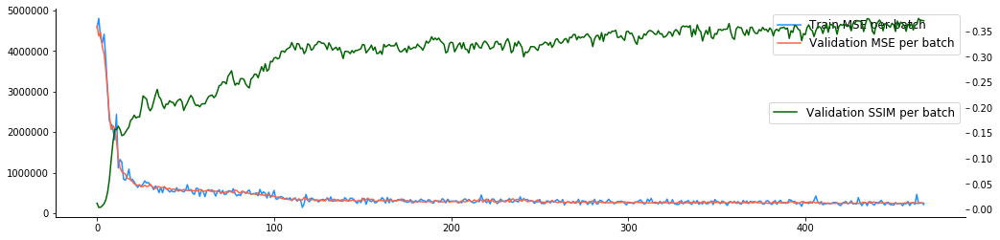

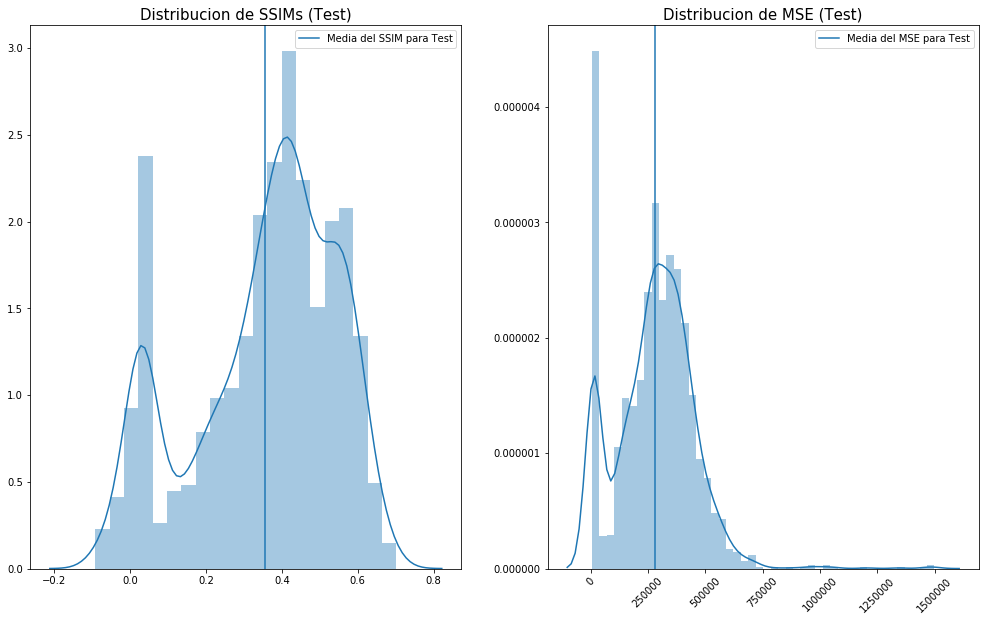

In [ ]:
koundinya_mse_test_metrics = get_metrics(koundinya_mse, test_loader, device = device, train_dict = koundinya_mse_TrainDict,
                                         per_band_error=True, prop_hyperion = prop_hyperion)

In [ ]:
#torch.save(koundinya_mse.state_dict(), '/koundinya_mse.pt')

<Figure size 720x720 with 0 Axes>

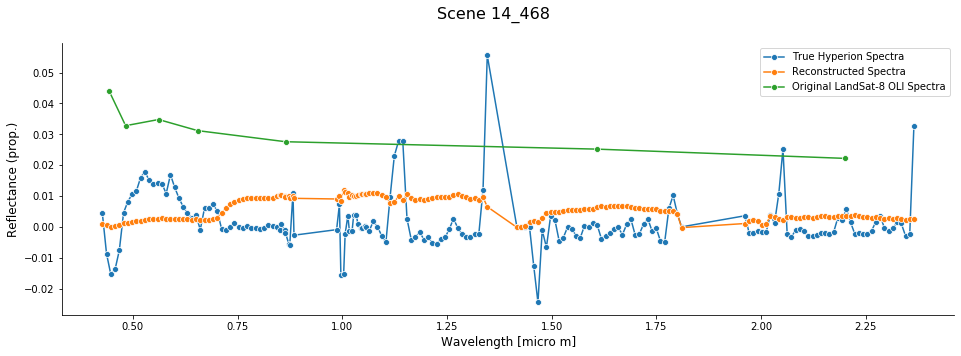

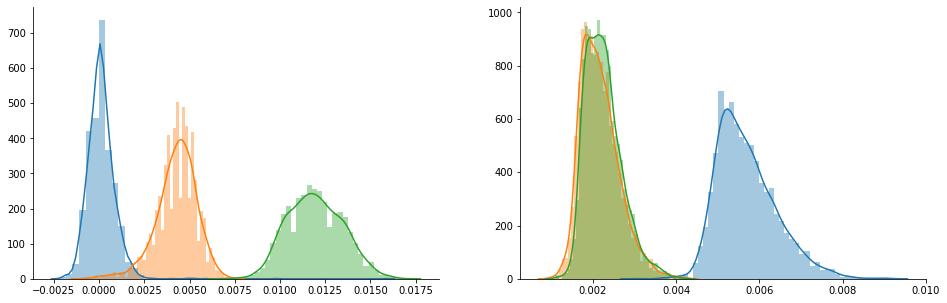

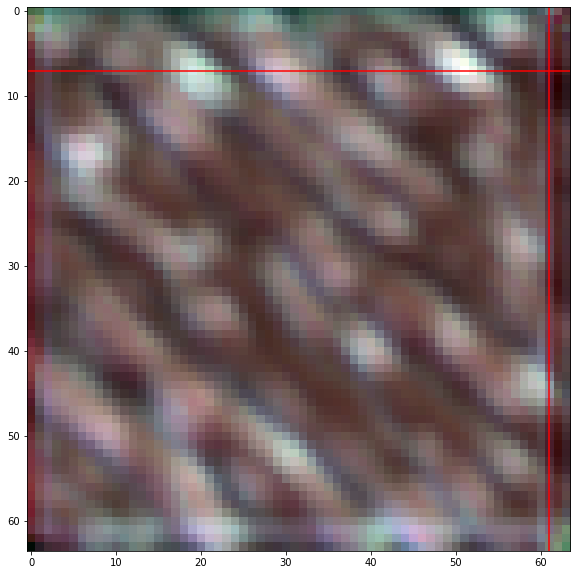

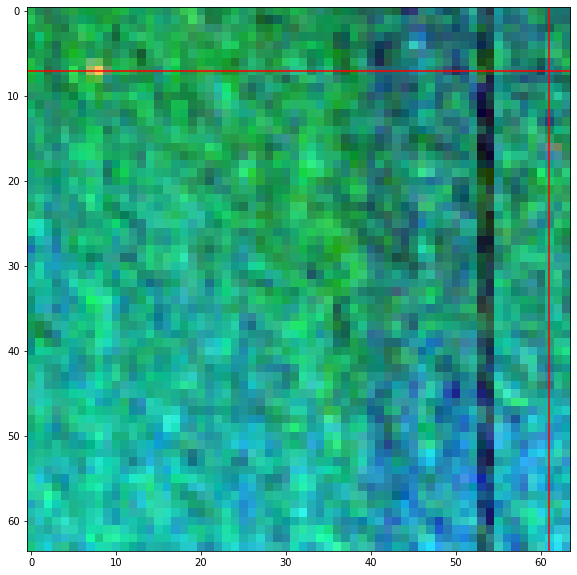

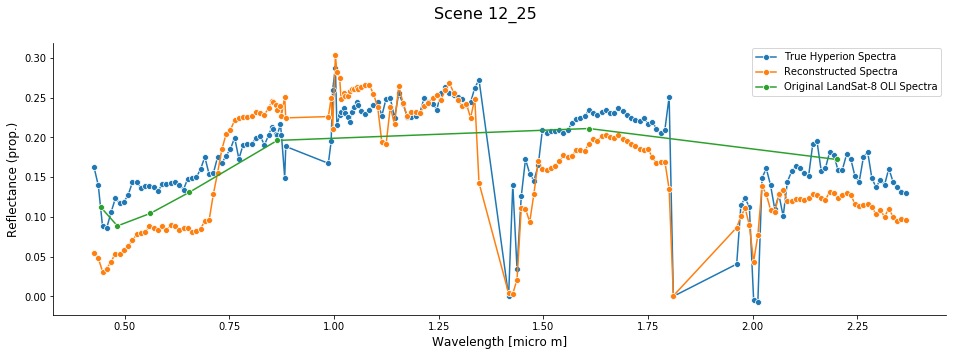

...

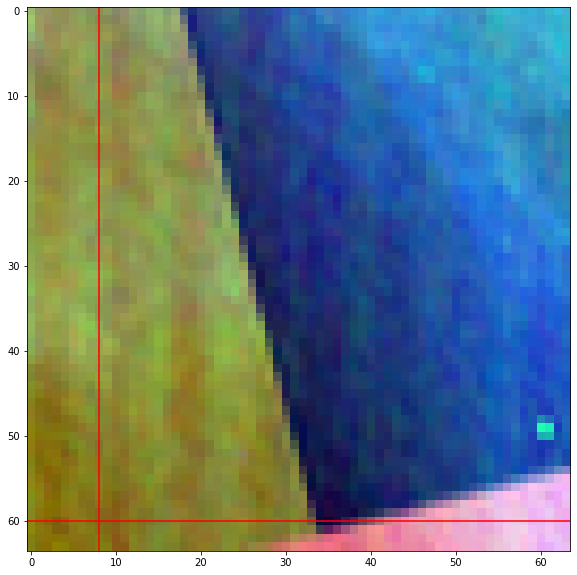

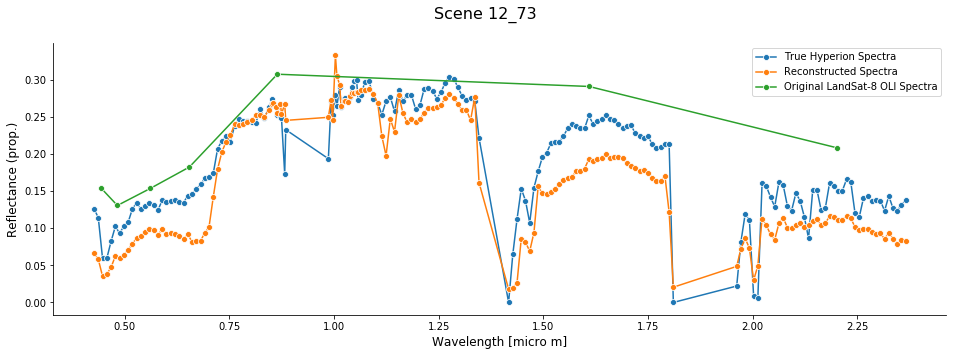

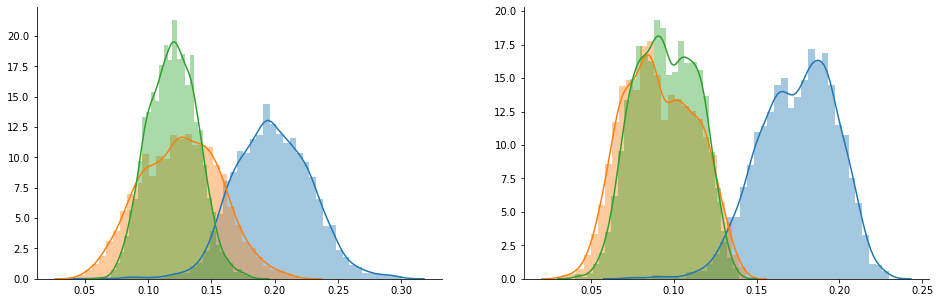

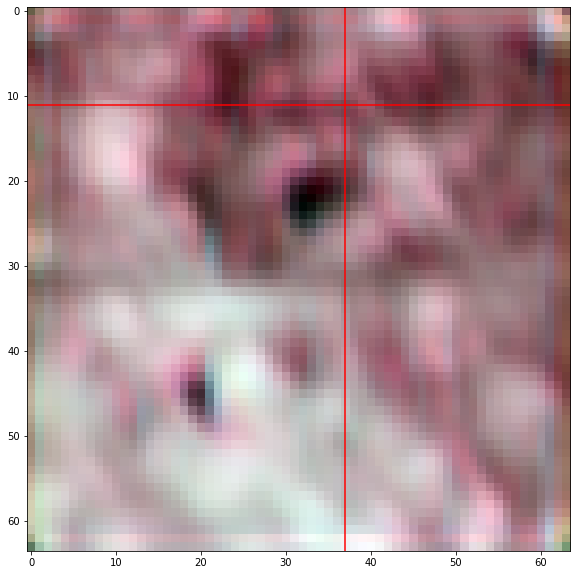

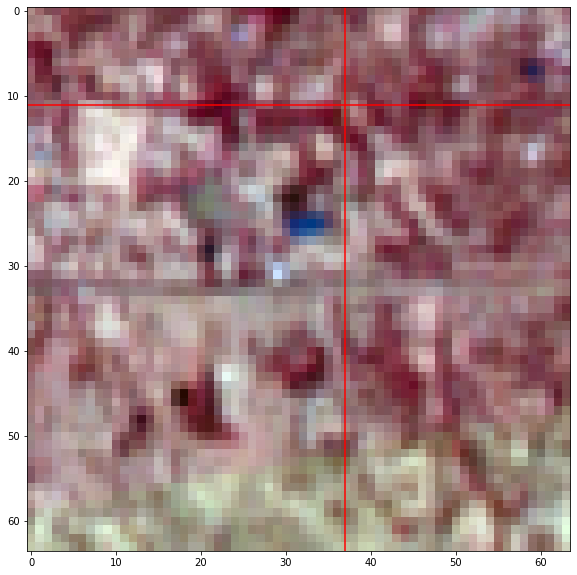

In [ ]:
plt.figure(figsize = (10,10))
np.random.seed(11235813)
for i in range(15):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches_random = np.random.choice(scenes_patches)
    show_spectral_reconstruction(koundinya_mse, BASE_PATH + 'hyperion_test_npy', BASE_PATH + 'landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches_random, wav_hsi = prop_hyperion, wav_msi= prop_landsat, device = device)

## MSE + Gram Loss

Modelo para la superresolución:

In [ ]:
# Reload Model with states
koundinya = Koundinya2D_CNN()
koundinya.load_state_dict(torch.load("Models/koundinya_perceptual.pt"))
koundinya.to(device);

Only execture the following cells if you want to re-train

In [ ]:
koundinya = Koundinya2D_CNN()
#koundinya.load_state_dict(torch.load(save_model_path))
koundinya.to(device)


Koundinya2D_CNN(
  (cnn_layers): Sequential(
    (0): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(7, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(60, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(100, 175, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)

Modelo perceptual

In [ ]:
save_perceptual_model_path = BASE_PATH + 'Models/AEHG_150_100_75.pt'

perceptual_model = Hourglass(175, 175, 150, 100, 75)
perceptual_model.load_state_dict(torch.load(save_perceptual_model_path))
perceptual_model.eval()
perceptual_model.to(device)

Hourglass(
  (encoder_upperBlock): Sequential(
    (0): Sequential(
      (0): Conv2d(175, 150, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ELU(alpha=1.0, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(150, 150, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ELU(alpha=1.0, inplace=True)
    )
  )
  (encoder_middleBlock): Sequential(
    (0): Sequential(
      (0): Conv2d(150, 100, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): ELU(alpha=1.0, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(100, 100, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): ELU(alpha=1.0, inplace=True)
    )
  )
  (encoder_lowerBlock): Sequential(
    (0): Conv2d(100, 75, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.01, inplace=True)
  )
  (skip2): Sequential(
    (0): Conv2d(150, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  (skip1): Sequential(
    (0): Conv2d(100, 75, kernel_size=(1, 1)

In [ ]:
n_epochs = 5
lr = 1e-3
loss_fn = GramLoss(perceptual_model, device = device)
loss_fn_MSE = MSELoss(reduction = 'mean')
optimizer = optim.Adam(koundinya.parameters(), lr = lr)
train_step = make_train_step(koundinya, loss_fn, optimizer)

losses_koundinya_perceptual = []
val_mse_koundinya_perceptual = []
val_losses_koundinya_perceptual = []
val_ssim_koundinya_perceptual = []


In [ ]:
%%time
for epoch in range(n_epochs):
    print(f'Epoch N°: {epoch+1}')
    for batch_n, (x_batch, y_batch) in enumerate(train_loader):
        print(f'\tBatch N°: {batch_n}')
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)
        
        loss = train_step(x_batch, y_batch)
        losses_koundinya_perceptual.append(loss)
        print(f'\t  * Train loss (MSE + Gram): {losses_koundinya_perceptual[-1]}')
        
        with torch.no_grad():
            val_losses_batch = []
            val_mse_batch = []
            val_ssim_batch = []
            for x_val, y_val in val_loader:
                x_val = x_val.to(device)
                y_val = y_val.to(device)
                
                koundinya.eval()
                
                yhat = koundinya(x_val).reshape(x_val.shape[0], 175, 64, 64)
                val_loss = loss_fn(y_val, yhat)
                val_ssim_batch.append(ssim(y_val, yhat).item())
                val_mse_batch.append(loss_fn_MSE(y_val, yhat).item())
                val_losses_batch.append(val_loss.item())

            val_ssim_koundinya_perceptual.append(np.mean(val_ssim_batch))
            val_mse_koundinya_perceptual.append(np.mean(val_mse_batch))
            val_losses_koundinya_perceptual.append(np.mean(val_losses_batch))
            print(f'\t  * Val loss (MSE + Gram): {val_losses_koundinya_perceptual[-1]}')
            print(f'\t  * Val MSE: {val_mse_koundinya_perceptual[-1]}')
            print(f'\t  * Val SSIM: {val_ssim_koundinya_perceptual[-1]}')


Epoch N°: 1
	Batch N°: 0
	  * Train loss (MSE + Gram): 3430076.5
	  * Val loss (MSE + Gram): 4549357.775
	  * Val MSE: 4444493.533333333
	  * Val SSIM: 0.006325638837491473
	Batch N°: 1
	  * Train loss (MSE + Gram): 4225188.5
	  * Val loss (MSE + Gram): 4615139.833333333
	  * Val MSE: 4376936.291666667
	  * Val SSIM: 0.00439885266047592
	Batch N°: 2
	  * Train loss (MSE + Gram): 4459365.5
	  * Val loss (MSE + Gram): 4113407.7083333335
	  * Val MSE: 4079845.3833333333
	  * Val SSIM: 0.010240319697186352
	Batch N°: 3
	  * Train loss (MSE + Gram): 3462084.25
	  * Val loss (MSE + Gram): 3739946.5833333335
	  * Val MSE: 3696059.3291666666
	  * Val SSIM: 0.022054621887703737
	Batch N°: 4
	  * Train loss (MSE + Gram): 4053869.25
	  * Val loss (MSE + Gram): 3129570.245833333
	  * Val MSE: 3116601.3666666667
	  * Val SSIM: 0.052003213887413344
	Batch N°: 5
	  * Train loss (MSE + Gram): 2970893.5
	  * Val loss (MSE + Gram): 2536787.9583333335
	  * Val MSE: 2483679.5458333334
	  * Val SSIM: 0.108

In [ ]:
koundinya_TrainDict = {'train_losses': losses, 'val_losses': val_losses, 'val_ssim': val_ssim}

In [ ]:
#koundinya_GramLoss_TrainDict = train_model(koundinya, n_epochs, loss_fn, optimizer, train_loader, val_loader)

Average MSE (Test): 505790.3728428266
RMSE (Test): 711.189407150322
RMSE scaled to reflectance (Test): 0.0711189407150322
Average SSIM (Test): 0.394824271199729
- Coastal Aerosol Band Average RMSE scaled to radiance (Test): 0.05869805275692737
- Blue Band Average RMSE scaled to radiance (Test): 0.047385852181745416
- Green Band Average RMSE scaled to radiance (Test): 0.04341121129036657
- Red Band Average RMSE scaled to radiance (Test): 0.04033988047462728
- NIR Band Average RMSE scaled to radiance (Test): 0.09400400934629083
- SWIR 1 Band Average RMSE scaled to radiance (Test): 0.06189759975570876
- SWIR 2 Band Average RMSE scaled to radiance (Test): 0.04324132860930223
- Panchromatic Band Average RMSE scaled to radiance (Test): 0.046716138532972885


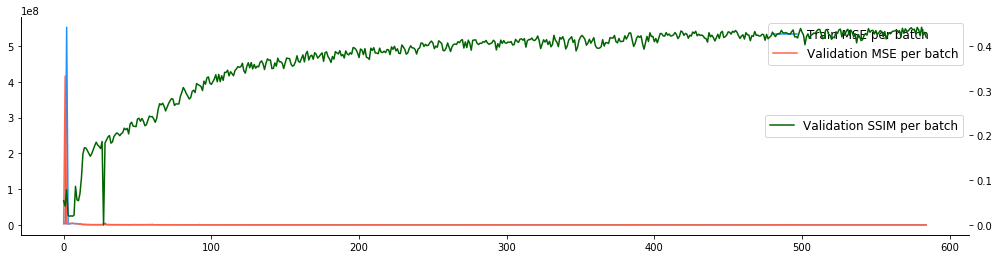

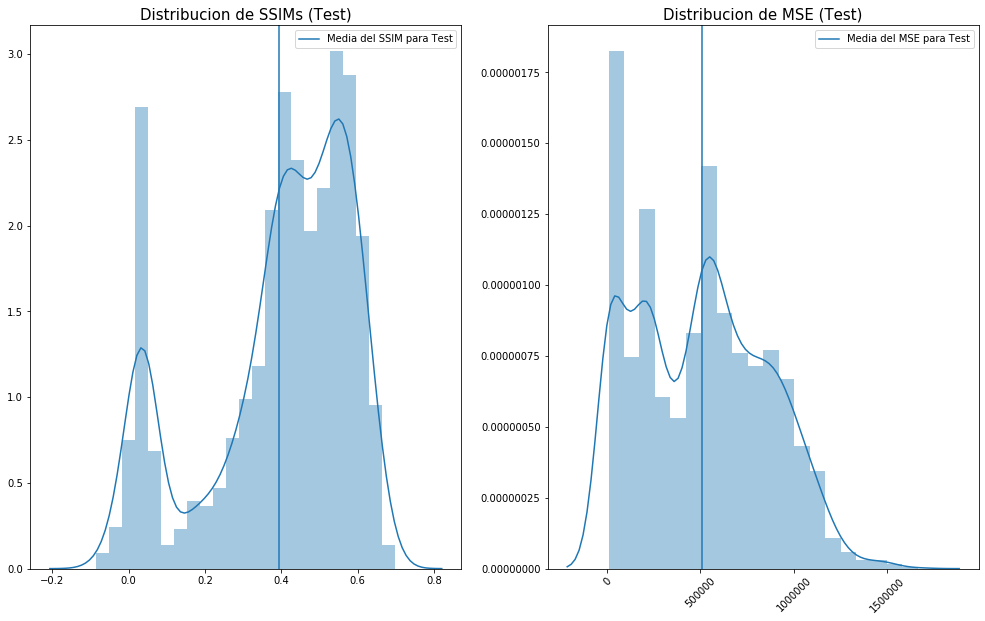

In [ ]:
koundinya_test_losses = get_metrics(koundinya, test_loader, device = device, train_dict = koundinya_TrainDict,
                                   per_band_error=True, prop_hyperion = prop_hyperion)

In [ ]:
save_model_path = 'Models/koundinya_perceptual.pt'
#torch.save(koundinya.state_dict(), save_model_path)


<Figure size 720x720 with 0 Axes>

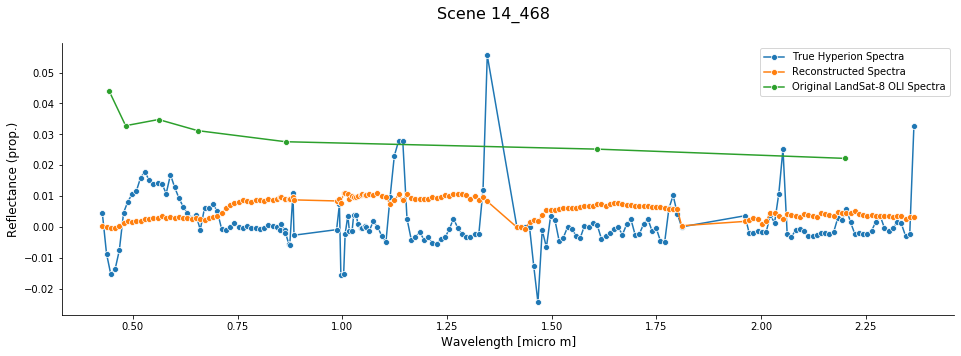

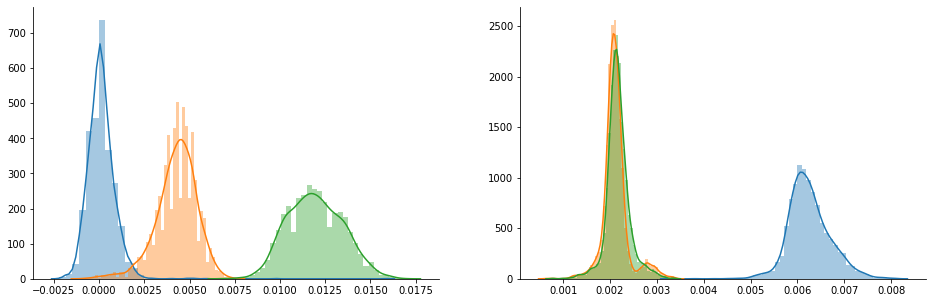

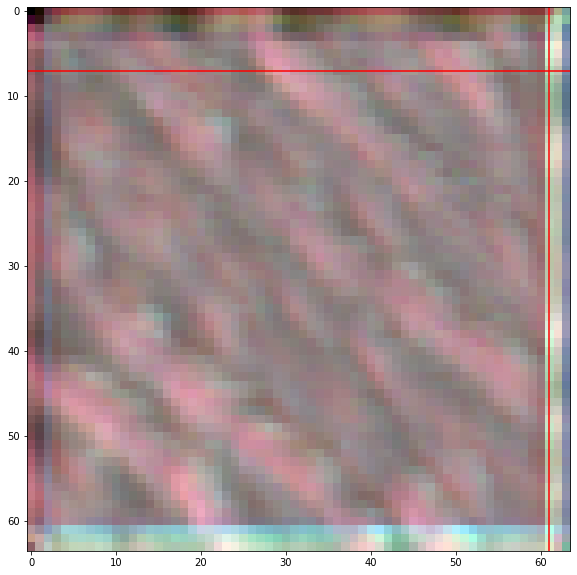

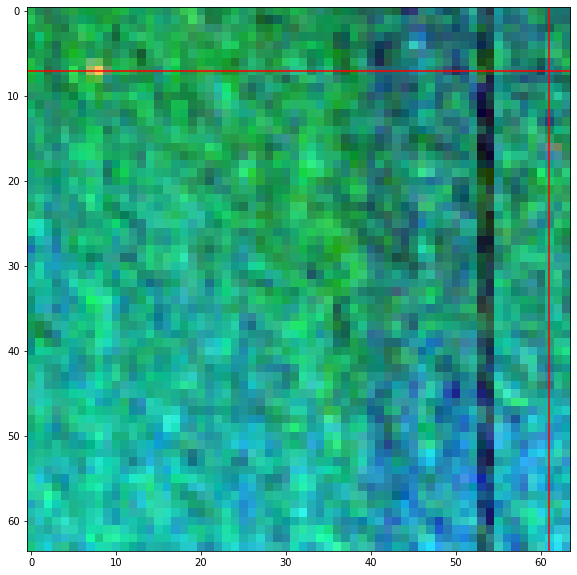

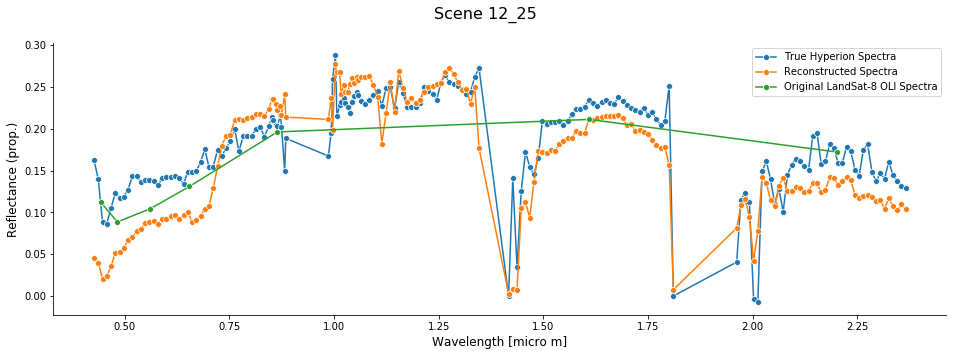

...

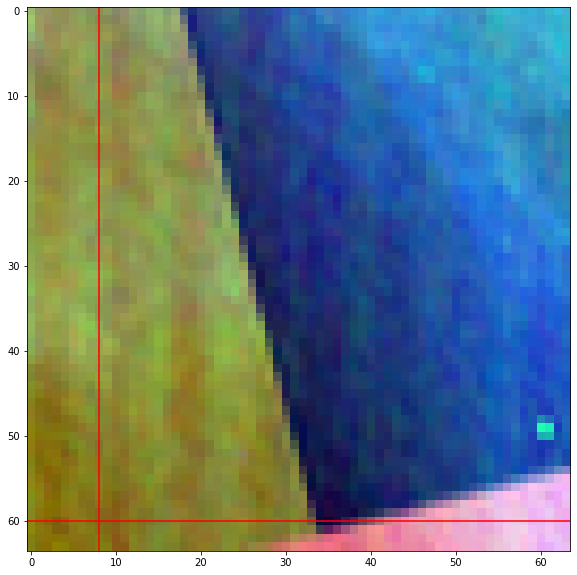

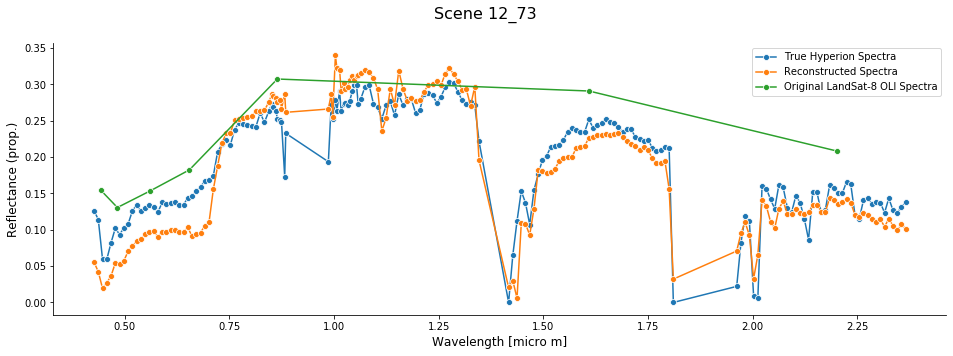

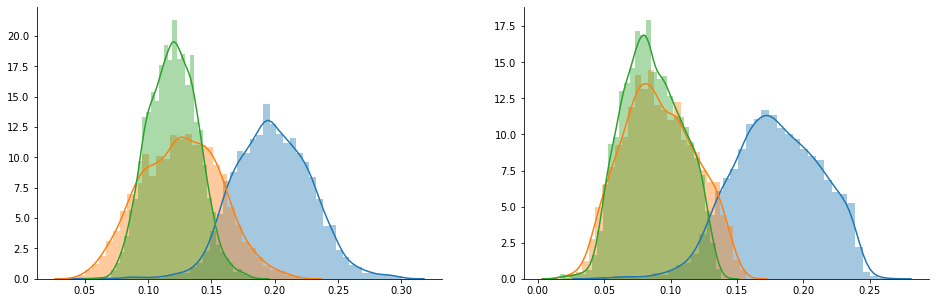

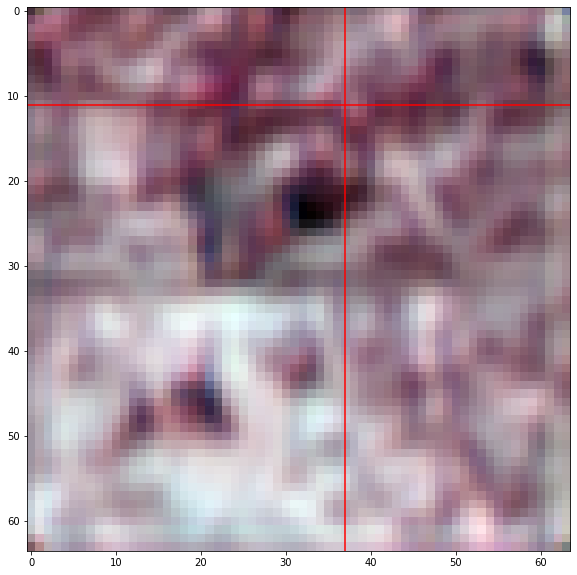

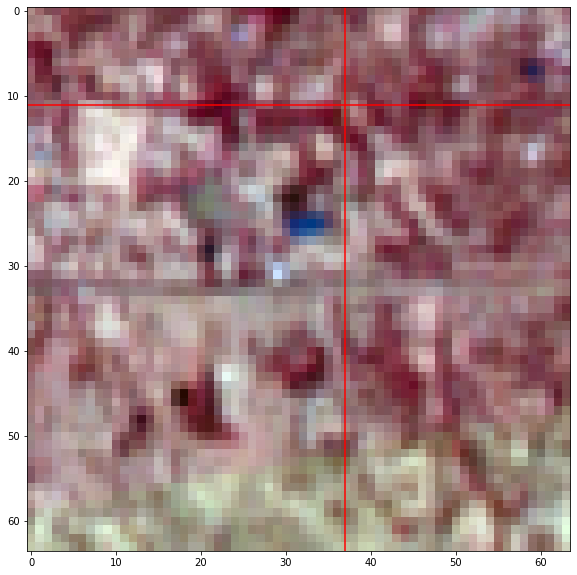

In [ ]:
plt.figure(figsize = (10,10))
np.random.seed(11235813)
for i in range(15):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches_random = np.random.choice(scenes_patches)
    show_spectral_reconstruction(koundinya, BASE_PATH + 'hyperion_test_npy', BASE_PATH + 'landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches_random, wav_hsi = prop_hyperion, wav_msi= prop_landsat, device = device)



# Hourglass

## MSE Loss

In [ ]:
# Reload Model with states
hg_SR = Hourglass(7, 175, 150, 100, 75)
hg_SR.load_state_dict(torch.load("Models/hg_SR_150_100_75.pt.pt"))
hg_SR.to(device);

Only execute the following cells if you want to retrain

In [ ]:
hg_SR = Hourglass(7, 175, 150, 100, 75)
hg_SR.to(device)
hg_SR.zero_grad()

In [ ]:
summary(hg_SR, input_size=(7, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 150, 64, 64]           9,600
         LeakyReLU-2          [-1, 150, 64, 64]               0
            Conv2d-3          [-1, 150, 64, 64]         202,650
         LeakyReLU-4          [-1, 150, 64, 64]               0
            Conv2d-5          [-1, 100, 64, 64]         375,100
         LeakyReLU-6          [-1, 100, 64, 64]               0
            Conv2d-7          [-1, 100, 64, 64]         250,100
         LeakyReLU-8          [-1, 100, 64, 64]               0
            Conv2d-9           [-1, 75, 64, 64]          67,575
        LeakyReLU-10           [-1, 75, 64, 64]               0
           Conv2d-11           [-1, 75, 64, 64]          50,700
        LeakyReLU-12           [-1, 75, 64, 64]               0
           Conv2d-13           [-1, 75, 64, 64]           7,575
           Conv2d-14          [-1, 100,

In [ ]:
n_epochs = 5
lr = 1e-3
loss_fn = MSELoss(reduction = 'mean')
optimizer = optim.Adam(hg_SR.parameters(), lr = lr)


In [ ]:
hg_SR_150_100_75_TrainDict = train_model(hg_SR, n_epochs, loss_fn, optimizer, train_loader, val_loader, device = device)

Epoch N°: 1
	Batch N°: 0
	  * Train loss: 4325744.0
	  * Val loss: 3657655.6666666665
	  * Val SSIM: 0.02064447393640876
	Batch N°: 1
	  * Train loss: 3677624.25
	  * Val loss: 234136194.26666668
	  * Val SSIM: 0.05671066592137019
	Batch N°: 2
	  * Train loss: 234229168.0
	  * Val loss: 2853812.1145833335
	  * Val SSIM: 0.04224844326575597
	Batch N°: 3
	  * Train loss: 2703028.25
	  * Val loss: 4105263.45
	  * Val SSIM: 0.006193134592225155
	Batch N°: 4
	  * Train loss: 3922996.5
	  * Val loss: 4334601.05
	  * Val SSIM: 0.0045438623211036125
	Batch N°: 5
	  * Train loss: 4300687.5
	  * Val loss: 4336509.408333333
	  * Val SSIM: 0.003247296864477297
	Batch N°: 6
	  * Train loss: 3747527.25
	  * Val loss: 4368563.866666666
	  * Val SSIM: 0.004756376919491837
	Batch N°: 7
	  * Train loss: 4609231.5
	  * Val loss: 3931009.933333333
	  * Val SSIM: 0.010886254130552213
	Batch N°: 8
	  * Train loss: 3854987.75
	  * Val loss: 2799439.1
	  * Val SSIM: 0.04481656768669685
	Batch N°: 9
	  * Train

Average MSE (Test): 400342.006738028
RMSE (Test): 632.7258543303158
RMSE scaled to reflectance (Test): 0.06327258543303158
Average SSIM (Test): 0.4233709864052254
- Coastal Aerosol Band Average RMSE scaled to radiance (Test): 0.06652870537366586
- Blue Band Average RMSE scaled to radiance (Test): 0.053967933307380214
- Green Band Average RMSE scaled to radiance (Test): 0.04492067637258814
- Red Band Average RMSE scaled to radiance (Test): 0.04081532041933597
- NIR Band Average RMSE scaled to radiance (Test): 0.07945172141253622
- SWIR 1 Band Average RMSE scaled to radiance (Test): 0.052019481122296554
- SWIR 2 Band Average RMSE scaled to radiance (Test): 0.0375836700234629
- Panchromatic Band Average RMSE scaled to radiance (Test): 0.05100617732801482


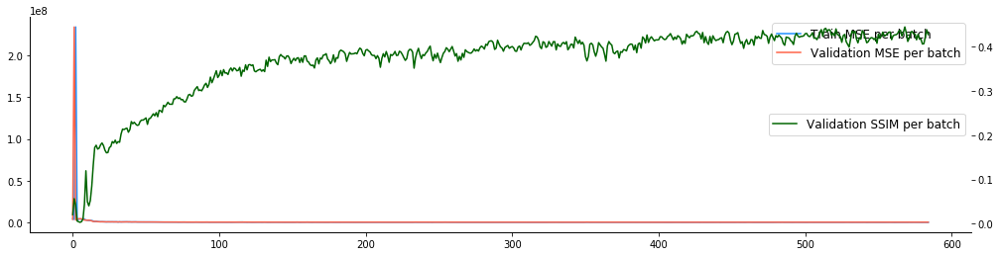

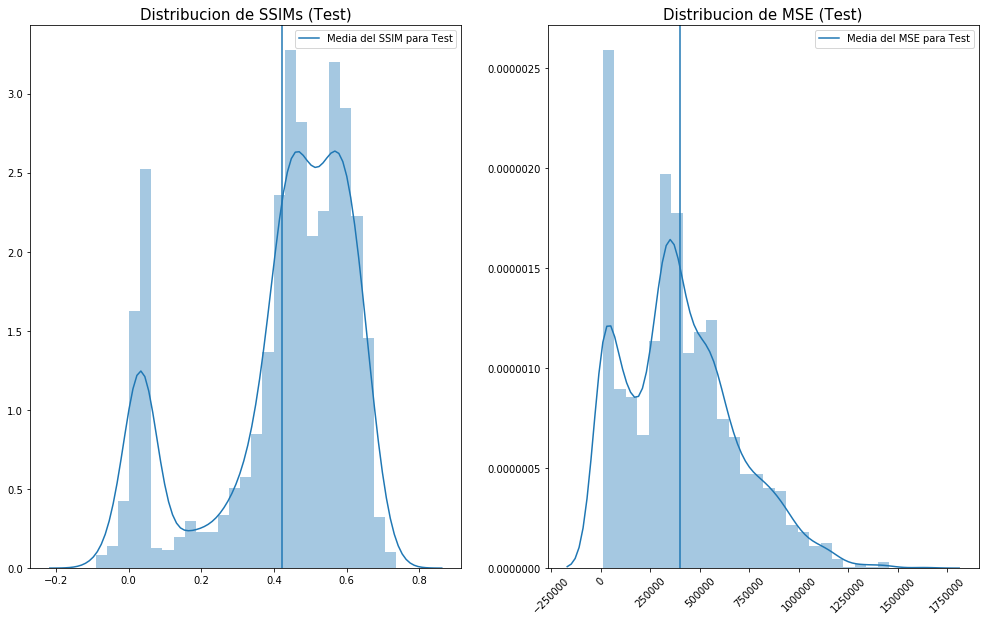

In [ ]:
hg_SR_150_100_75_test_losses = get_metrics(hg_SR, test_loader, device = device, train_dict = hg_SR_150_100_75_TrainDict,
                                           per_band_error=True, prop_hyperion = prop_hyperion)

In [ ]:
#save_model_path = '/hg_SR_150_100_75.pt'
#torch.save(hg_SR.state_dict(), save_model_path)


<Figure size 720x720 with 0 Axes>

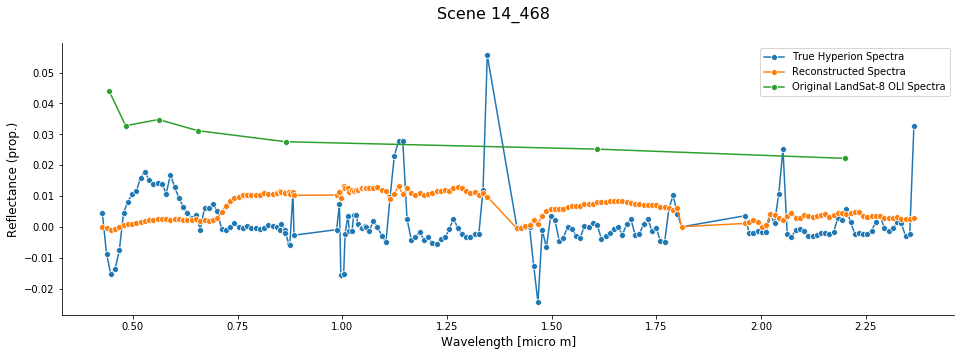

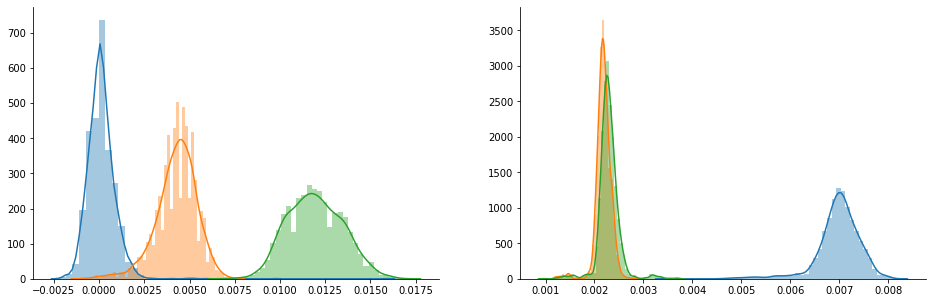

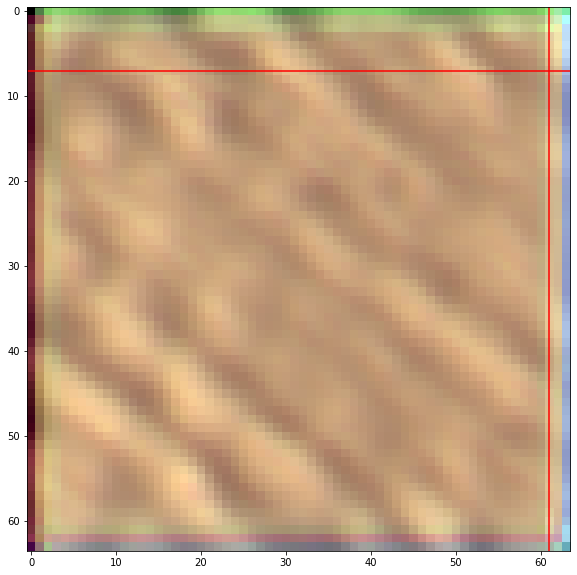

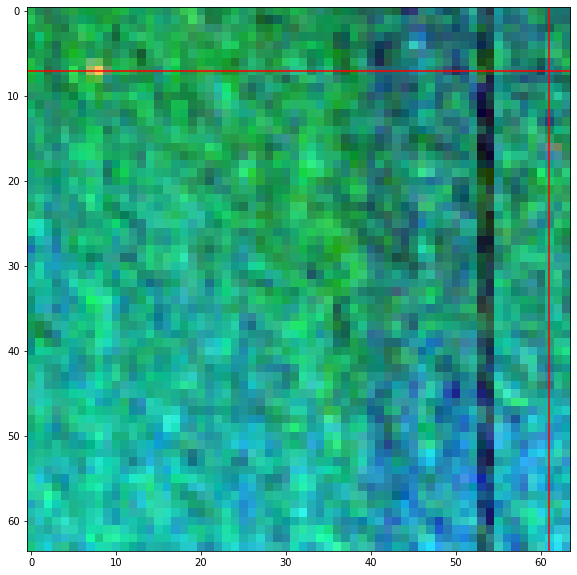

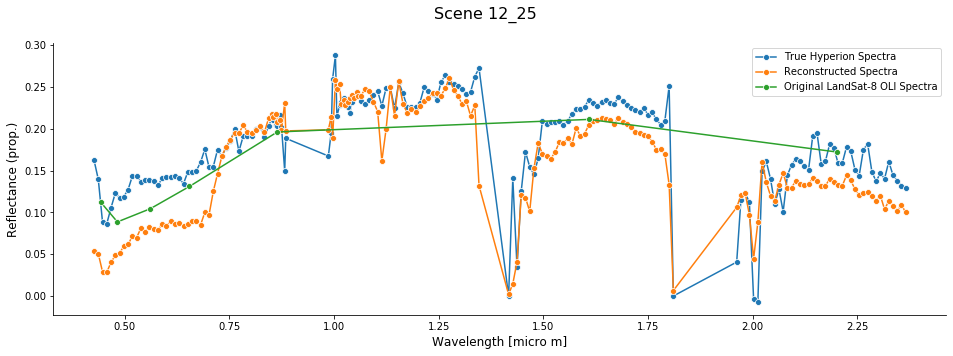

...

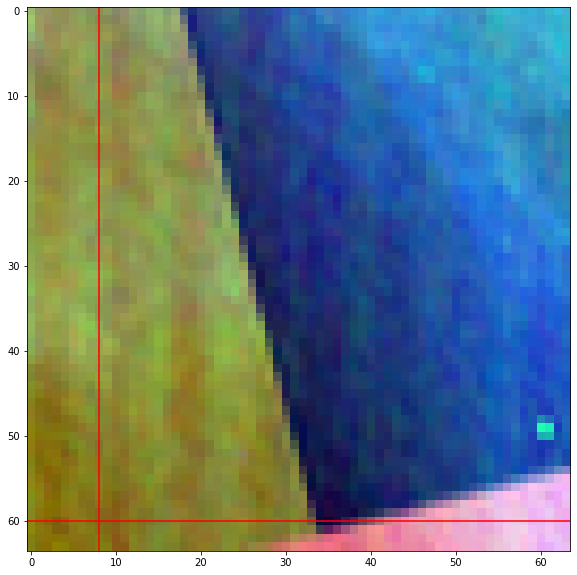

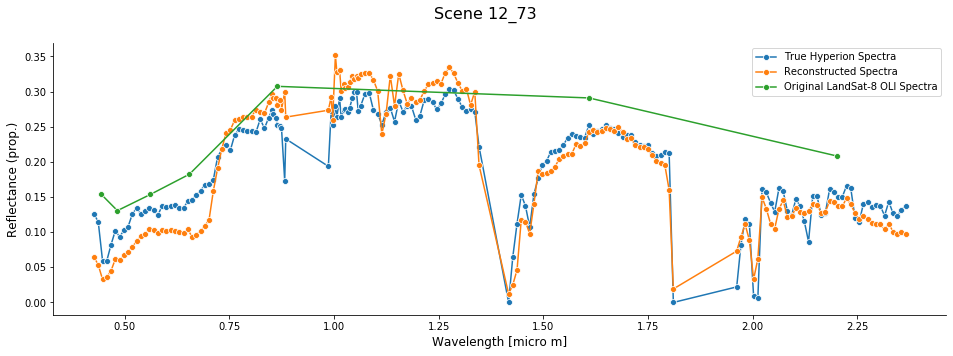

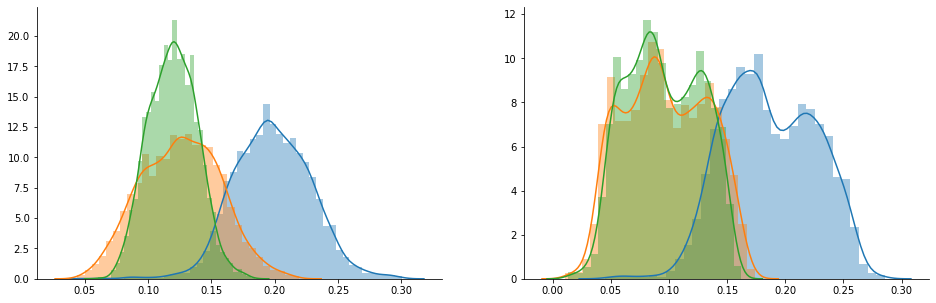

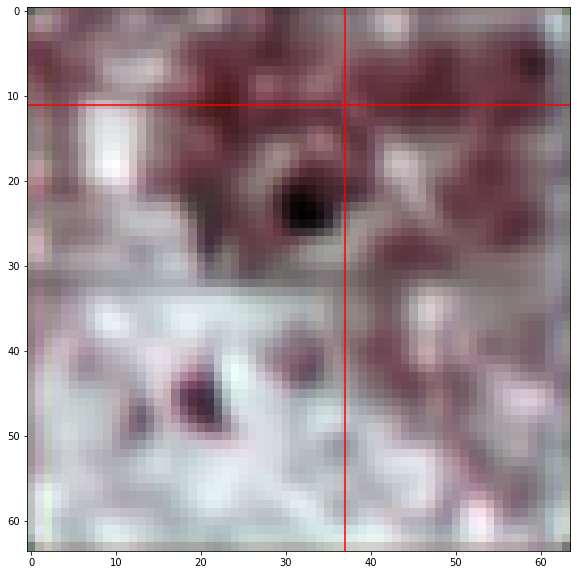

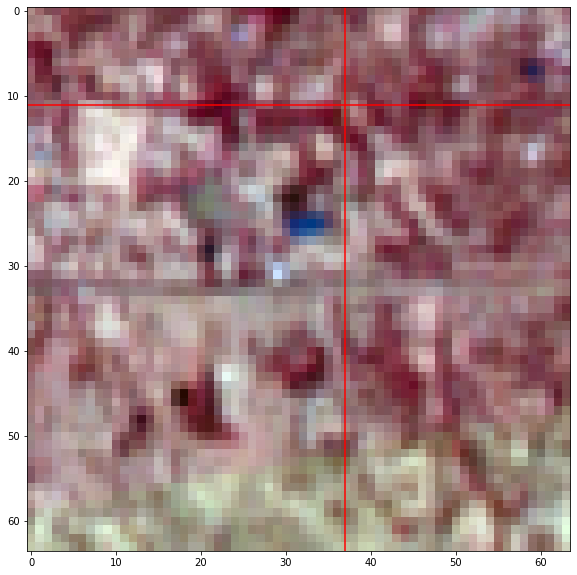

In [ ]:

plt.figure(figsize = (10,10))
np.random.seed(11235813)
for i in range(15):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches_random = np.random.choice(scenes_patches)
    show_spectral_reconstruction(hg_SR, BASE_PATH + 'hyperion_test_npy', BASE_PATH + 'landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches_random, wav_hsi = prop_hyperion, wav_msi= prop_landsat, device = device)

## MSE + Gram Loss

In [ ]:
# Reload Model with states
koundinya_mse = Hourglass(7, 175, 150, 100, 75)
koundinya_mse.load_state_dict(torch.load("Models/hg_SR_150_100_75_perceptual.pt"))
koundinya_mse.to(device);

Only execute the following cells if you want to re-train

In [ ]:
save_perceptual_model_path = BASE_PATH + '/AEHG_150_100_75.pt'
perceptual_model = Hourglass(175, 175, 150, 100, 75)
perceptual_model.load_state_dict(torch.load(save_perceptual_model_path))
perceptual_model.to(device)

Hourglass(
  (encoder_upperBlock): Sequential(
    (0): Sequential(
      (0): Conv2d(175, 150, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(150, 150, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
  )
  (encoder_middleBlock): Sequential(
    (0): Sequential(
      (0): Conv2d(150, 100, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(100, 100, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
  )
  (encoder_lowerBlock): Sequential(
    (0): Conv2d(100, 75, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.01, inplace=True)
  )
  (skip2): Sequential(
    (0): Conv2d(150, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  

In [ ]:
loss_fn = GramLoss(perceptual_model, device = device)
loss_fn_MSE = MSELoss(reduction = 'mean')
optimizer = optim.Adam(hg_SR_150_100_75_perceptualTrained.parameters(), lr = lr)
train_step = make_train_step(hg_SR_150_100_75_perceptualTrained, loss_fn, optimizer)
n_epochs = 5
lr = 1e-3

losses_hg_perceptual = []
val_mse_hg_perceptual = []
val_losses_hg_perceptual = []
val_ssim_hg_perceptual = []

In [ ]:
%%time
for epoch in range(n_epochs):
    print(f'Epoch N°: {epoch+1}')
    for batch_n, (x_batch, y_batch) in enumerate(train_loader):
        print(f'\tBatch N°: {batch_n}')
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)
        
        loss = train_step(x_batch, y_batch)
        losses.append(loss)
        print(f'\t  * Train loss (MSE + Gram): {losses[-1]}')
        
        with torch.no_grad():
            val_losses_batch = []
            val_mse_batch = []
            val_ssim_batch = []
            for x_val, y_val in val_loader:
                x_val = x_val.to(device)
                y_val = y_val.to(device)
                
                koundinya.eval()
                
                yhat = hg_SR_150_100_75_perceptualTrained(x_val).reshape(x_val.shape[0], 175, 64, 64)
                val_loss = loss_fn(y_val, yhat)
                val_ssim_batch.append(ssim(y_val, yhat).item())
                val_mse_batch.append(loss_fn_MSE(y_val, yhat).item())
                val_losses_batch.append(val_loss.item())

            val_ssim_hg_perceptual.append(np.mean(val_ssim_batch))
            val_mse_hg_perceptual.append(np.mean(val_mse_batch))
            val_losses_hg_perceptual.append(np.mean(val_losses_batch))
            print(f'\t  * Val loss (MSE + Gram): {val_losses_hg_perceptual[-1]}')
            print(f'\t  * Val MSE: {val_mse_hg_perceptual[-1]}')
            print(f'\t  * Val SSIM: {val_ssim_hg_perceptual[-1]}')


Epoch N°: 1
	Batch N°: 0
	  * Train loss (MSE + Gram): 4346264.0
	  * Val loss (MSE + Gram): 3863444.5833333335
	  * Val MSE: 3710046.2
	  * Val SSIM: 0.023064016985396545
	Batch N°: 1
	  * Train loss (MSE + Gram): 3378691.75
	  * Val loss (MSE + Gram): 26240948012.266666
	  * Val MSE: 376733001.6
	  * Val SSIM: 0.05105628530921725
	Batch N°: 2
	  * Train loss (MSE + Gram): 481022496.0
	  * Val loss (MSE + Gram): 2944439.191666667
	  * Val MSE: 2880560.6083333334
	  * Val SSIM: 0.0401910695557793
	Batch N°: 3
	  * Train loss (MSE + Gram): 3093977.5
	  * Val loss (MSE + Gram): 4591897.408333333
	  * Val MSE: 4444505.941666666
	  * Val SSIM: 0.0035799313569441437
	Batch N°: 4
	  * Train loss (MSE + Gram): 4273028.0
	  * Val loss (MSE + Gram): 4571009.25
	  * Val MSE: 4485417.925
	  * Val SSIM: 0.0030779365760584673
	Batch N°: 5
	  * Train loss (MSE + Gram): 4478933.0
	  * Val loss (MSE + Gram): 4400892.175
	  * Val MSE: 4379623.941666666
	  * Val SSIM: 0.002331861583904053
	Batch N°: 6
	

In [ ]:
hg_SR_150_100_75_perceptualTrained_TrainDict = {'train_losses': losses_hg_perceptual, 'val_losses': val_losses_hg_perceptual, 'val_ssim': val_ssim_hg_perceptual}

In [ ]:
save_model_path = '/hg_SR_150_100_75_perceptual.pt'
#torch.save(hg_SR_150_100_75_perceptualTrained.state_dict(), save_model_path)

# Reload Model with states
#hg_SR_150_100_75_perceptualTrained = Hourglass(7, 175, 150, 100, 75)
#hg_SR_150_100_75_perceptualTrained.to(device);
#hg_SR_150_100_75_perceptualTrained.load_state_dict(torch.load(save_model_path))

Average MSE (Test): 294249.1404066028
RMSE (Test): 542.4473618763417
RMSE scaled to reflectance (Test): 0.05424473618763417
Average SSIM (Test): 0.39031936384925975
- Coastal Aerosol Band Average RMSE scaled to radiance (Test): 0.05762476165197465
- Blue Band Average RMSE scaled to radiance (Test): 0.04559827493594576
- Green Band Average RMSE scaled to radiance (Test): 0.04382327253154209
- Red Band Average RMSE scaled to radiance (Test): 0.0392060110330752
- NIR Band Average RMSE scaled to radiance (Test): 0.05763669007853132
- SWIR 1 Band Average RMSE scaled to radiance (Test): 0.0482535741854731
- SWIR 2 Band Average RMSE scaled to radiance (Test): 0.040130911799429354
- Panchromatic Band Average RMSE scaled to radiance (Test): 0.04626595884840972


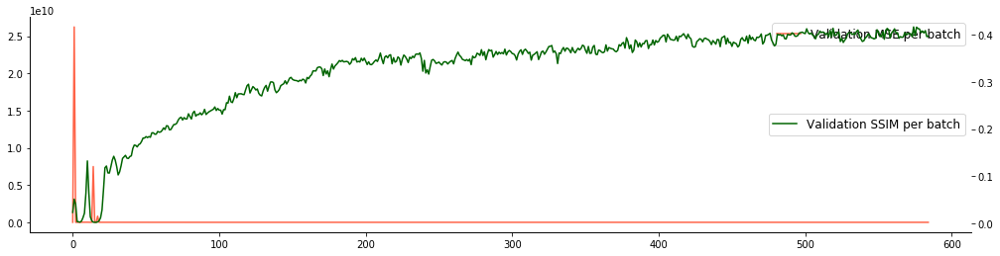

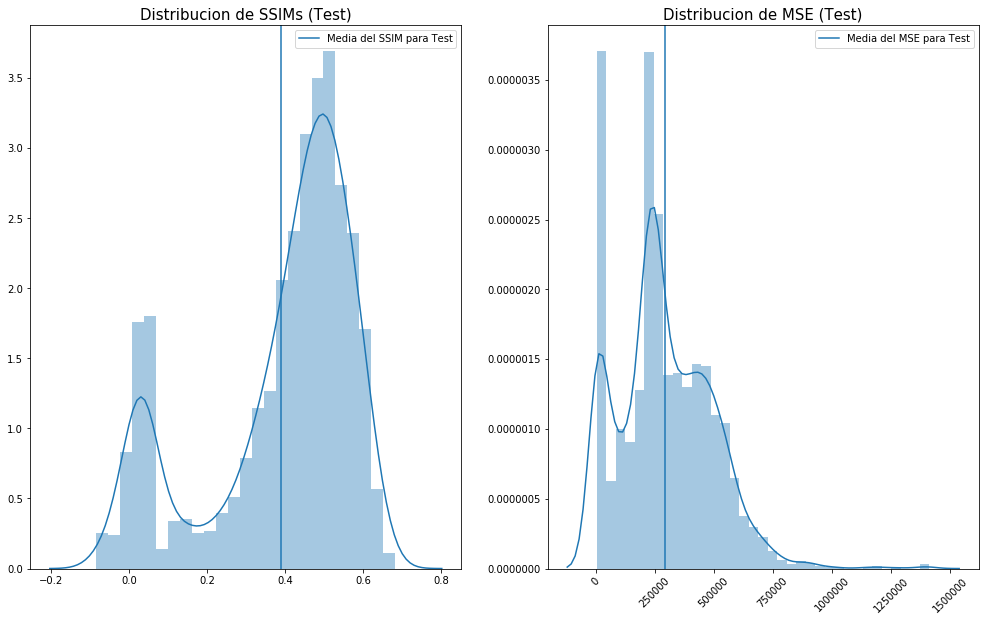

In [ ]:
hg_SR_150_100_75_perceptualTrained_test_metrics = get_metrics(
                                                        model = hg_SR_150_100_75_perceptualTrained, 
                                                        test_loader = test_loader, 
                                                        device = device,
                                                        train_dict = hg_SR_150_100_75_perceptualTrained_TrainDict,
                                                        per_band_error = True,
                                                        prop_hyperion = prop_hyperion)

Reconstrucciones

<Figure size 720x720 with 0 Axes>

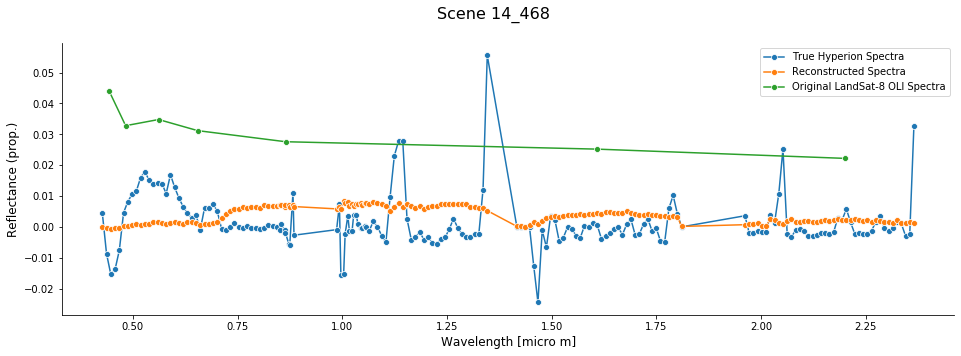

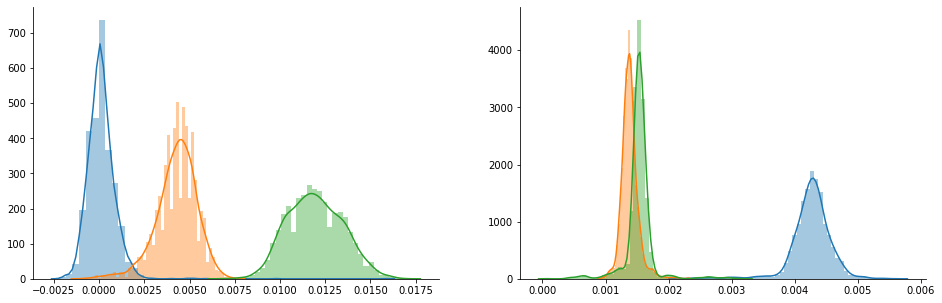

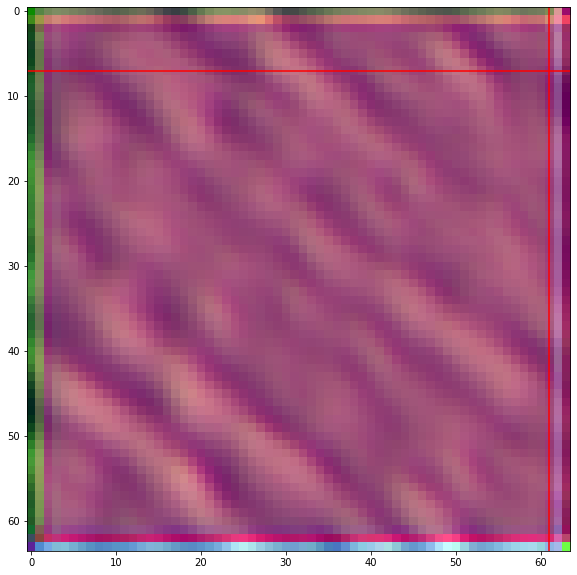

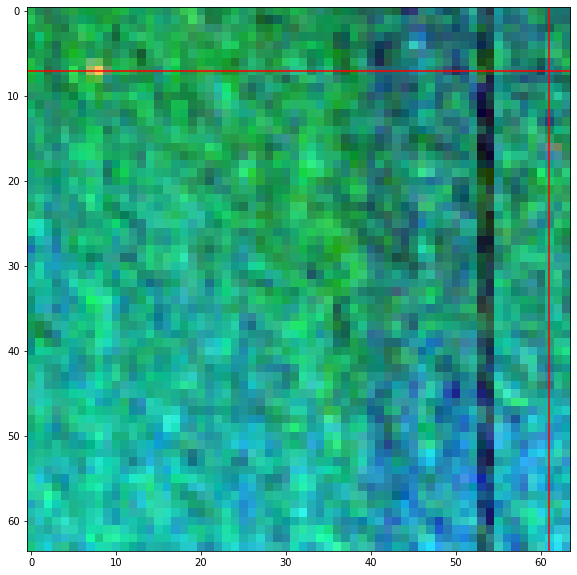

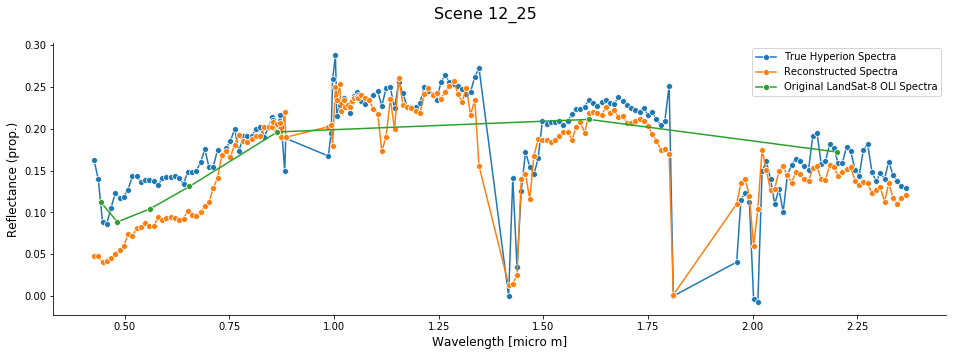

...

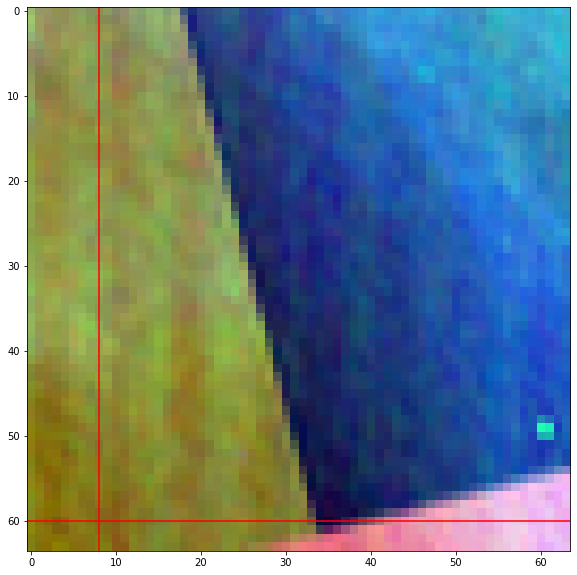

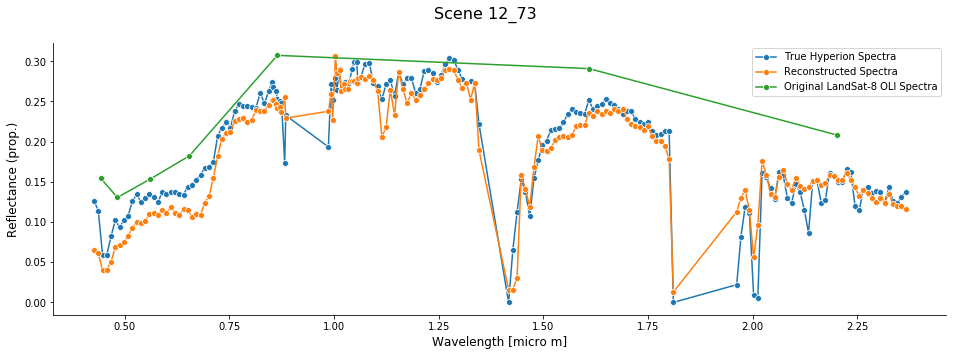

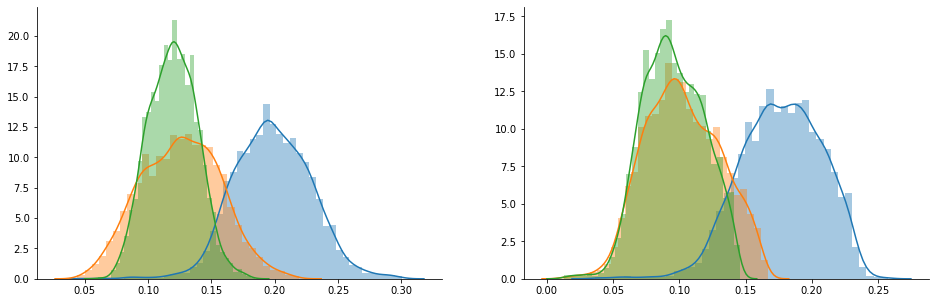

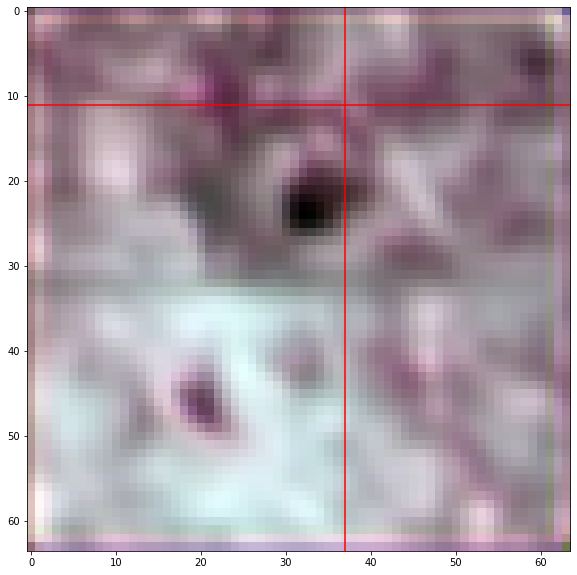

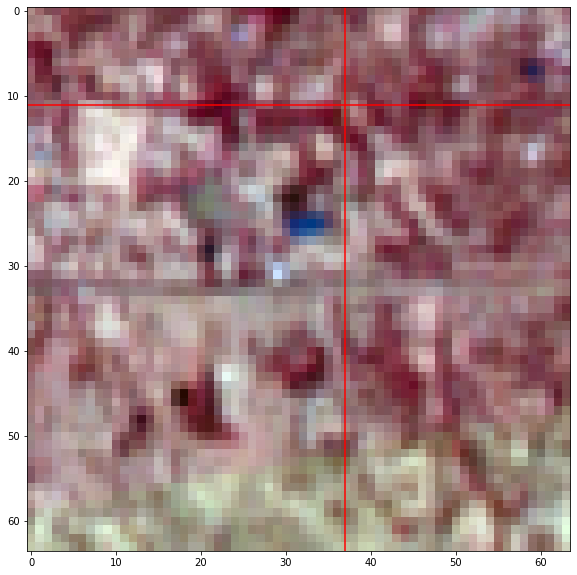

In [ ]:
plt.figure(figsize = (10,10))
np.random.seed(11235813)
for i in range(15):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches_random = np.random.choice(scenes_patches)
    show_spectral_reconstruction(hg_SR_150_100_75_perceptualTrained, BASE_PATH + 'Images/hyperion_test_npy', BASE_PATH + 'Images/landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches_random, wav_hsi = prop_hyperion, wav_msi= prop_landsat, device = device)

-------
# Resultados

## Modelos para SR

<style type="text/css">
.tg  {border-collapse:collapse;border-color:#93a1a1;border-spacing:0;}
.tg td{background-color:#fdf6e3;border-color:#93a1a1;border-style:solid;border-width:1px;color:#002b36;
  font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg th{background-color:#657b83;border-color:#93a1a1;border-style:solid;border-width:1px;color:#fdf6e3;
  font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg .tg-baqh{text-align:center;vertical-align:top}
.tg .tg-a1rj{background-color:#dae8fc;color:#002b36;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-amwm{font-weight:bold;text-align:center;vertical-align:top}
</style>
<table class="tg">
<thead>
  <tr>
    <th class="tg-a1rj">Modelo</th>
    <th class="tg-a1rj">Loss</th>
    <th class="tg-a1rj">MSE Test</th>
    <th class="tg-a1rj">RMSE  - Reflectance Scaled (Test)</th>
    <th class="tg-a1rj">SSIM Medio sobre Test</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td class="tg-baqh">Koundinya</td>
    <td class="tg-baqh">MSE</td>
    <td class="tg-amwm">280667.426</td>
    <td class="tg-amwm">0.05298</td>
    <td class="tg-baqh">0.3544</td>
  </tr>
  <tr>
    <td class="tg-baqh">Koundinya</td>
    <td class="tg-baqh">MSE + Gram</td>
    <td class="tg-baqh">505790.373</td>
    <td class="tg-baqh">0.07112</td>
    <td class="tg-baqh">0.3948</td>
  </tr>
  <tr>
    <td class="tg-baqh">Hourglass</td>
    <td class="tg-baqh">MSE</td>
    <td class="tg-baqh">400342.006</td>
    <td class="tg-baqh">0.06327</td>
    <td class="tg-baqh">0.4233</td>
  </tr>
  <tr>
    <td class="tg-baqh">Hourglass</td>
    <td class="tg-baqh">MSE + Gram</td>
    <td class="tg-baqh">294249.140</td>
    <td class="tg-baqh">0.05424</td>
    <td class="tg-amwm">0.3903</td>
  </tr>
</tbody>
</table>